In [1]:
!pip install torchtext==0.8.0

     |████████████████████████████████| 7.0MB 986kB/s 
  Found existing installation: torchtext 0.9.1
    Uninstalling torchtext-0.9.1:
      Successfully uninstalled torchtext-0.9.1


In [3]:
!pip install pytorch-lightning

     |████████████████████████████████| 849kB 7.6MB/s 
     |████████████████████████████████| 276kB 11.3MB/s 
     |████████████████████████████████| 112kB 26.2MB/s 
     |████████████████████████████████| 829kB 18.2MB/s 
     |████████████████████████████████| 184kB 34.3MB/s 
     |████████████████████████████████| 1.3MB 34.8MB/s 
     |████████████████████████████████| 143kB 46.1MB/s 
     |████████████████████████████████| 296kB 43.7MB/s 
  Created wheel for PyYAML: filename=PyYAML-5.3.1-cp37-cp37m-linux_x86_64.whl size=44620 sha256=74864e049586f7e9e7f434adf523b3678018ef178bb299cba5681eeb0f947ce2
  Stored in directory: /root/.cache/pip/wheels/a7/c1/ea/cf5bd31012e735dc1dfea3131a2d5eae7978b251083d6247bd
  Created wheel for future: filename=future-0.18.2-cp37-none-any.whl size=491058 sha256=a6afeb6c49c9ad9e776dd36e27f26378fefa4dbe567b039ea3fb2cc8fd04507d
  Stored in directory: /root/.cache/pip/wheels/8b/99/a0/81daf51dcd359a9377b110a8a886b3895921802d2fc1b2397e
Successfully built PyYAML

In [4]:
!pip install loguru

     |████████████████████████████████| 61kB 4.9MB/s 


In [1]:
#!pip install git+https://github.com/PyTorchLightning/pytorch-lightning
import pytorch_lightning as pl
print(pl.__version__)

1.2.8


In [2]:
from sklearn.model_selection import train_test_split

In [3]:
from nam.data import *
from nam.config import defaults
from nam.models import NAM, DNN, get_num_units, FeatureNN
from nam.engine import Engine
from nam.utils.graphing import *

In [4]:
from nam.utils import graphing

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, WeightedRandomSampler

import numpy as np
import pandas as pd

In [6]:
# filter dplyr warnings
%load_ext rpy2.ipython
import warnings
warnings.filterwarnings('ignore')

In [7]:
%%R
library(dplyr)
library(ggplot2)
raw_data <- read.csv("https://raw.githubusercontent.com/propublica/compas-analysis/master/compas-scores-two-years.csv")
nrow(raw_data)

R[write to console]: 
Attaching package: ‘dplyr’


R[write to console]: The following objects are masked from ‘package:stats’:

    filter, lag


R[write to console]: The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




[1] 7214


In [8]:
%%R
df <- dplyr::select(raw_data, age, c_charge_degree, race, age_cat, score_text, sex, priors_count, 
                    days_b_screening_arrest, decile_score, is_recid, two_year_recid, c_jail_in, c_jail_out) %>% 
        filter(days_b_screening_arrest <= 30) %>%
        filter(days_b_screening_arrest >= -30) %>%
        filter(is_recid != -1) %>%
        filter(c_charge_degree != "O") %>%
        filter(score_text != 'N/A')
nrow(df)

[1] 6172


In [9]:
%%R
df$length_of_stay <- as.numeric(as.Date(df$c_jail_out) - as.Date(df$c_jail_in))

In [10]:
%%R
df <- mutate(df, crime_factor = factor(c_charge_degree)) %>%
      mutate(age_factor = as.factor(age_cat)) %>%
      within(age_factor <- relevel(age_factor, ref = 1)) %>%
      mutate(race_factor = factor(race)) %>%
      within(race_factor <- relevel(race_factor, ref = 3)) %>%
      mutate(gender_factor = factor(sex, labels= c("Female","Male"))) %>%
      within(gender_factor <- relevel(gender_factor, ref = 2)) %>%
      mutate(score_factor = factor(score_text != "Low", labels = c("LowScore","HighScore")))

In [11]:
%%R
df <- df %>% select('age', 'race_factor', 'gender_factor', 'score_factor', 'priors_count', 'length_of_stay', 'crime_factor')

In [12]:
%%R
df %>% head()

  age      race_factor gender_factor score_factor priors_count length_of_stay
1  69            Other          Male     LowScore            0              1
2  34 African-American          Male     LowScore            0             10
3  24 African-American          Male     LowScore            4              1
4  44            Other          Male     LowScore            0              1
5  41        Caucasian          Male    HighScore           14              6
6  43            Other          Male     LowScore            3              1
  crime_factor
1            F
2            F
3            F
4            M
5            F
6            F


In [44]:
compas_df_categorical = %R df

In [45]:
compas_df = %R df

In [46]:
compas_df.head()

,age,race_factor,gender_factor,score_factor,priors_count,length_of_stay,crime_factor
1,69,Other,Male,LowScore,0,1.0,F
2,34,African-American,Male,LowScore,0,10.0,F
3,24,African-American,Male,LowScore,4,1.0,F
4,44,Other,Male,LowScore,0,1.0,M
5,41,Caucasian,Male,HighScore,14,6.0,F


In [47]:
cat_features = ['race_factor','gender_factor', 'crime_factor']
numeric_features = ['age','priors_count', 'length_of_stay']
target_feature = ["score_factor"]

In [48]:
from sklearn.preprocessing import LabelEncoder 
ly = LabelEncoder()

In [49]:
compas_df['race_factor'] = ly.fit_transform(compas_df['race_factor'])
race_mapping = dict(zip(ly.classes_, range(0, len(ly.classes_)+1)))
compas_df['gender_factor'] = ly.fit_transform(compas_df['gender_factor'])
gender_mapping = dict(zip(ly.classes_, range(0, len(ly.classes_)+1)))
compas_df['crime_factor'] = ly.fit_transform(compas_df['crime_factor'])
crime_factor_mapping = dict(zip(ly.classes_, range(0, len(ly.classes_)+1)))

# compas_df['score_factor'] = ly.fit_transform(compas_df['score_factor'])
# score_factor_mapping = dict(zip(ly.classes_, range(0, len(ly.classes_)+1)))

compas_df['score_factor'] = compas_df['score_factor'].map({'HighScore' : 1, 'LowScore': 0})


In [50]:
score_factor_mapping

{'HighScore': 0, 'LowScore': 1}

In [51]:
compas_df.head()

,age,race_factor,gender_factor,score_factor,priors_count,length_of_stay,crime_factor
1,69,5,1,0,0,1.0,0
2,34,0,1,0,0,10.0,0
3,24,0,1,0,4,1.0,0
4,44,5,1,0,0,1.0,1
5,41,2,1,1,14,6.0,0


In [71]:
config = defaults()
config.dropout = 0.1
config.activation='exu'
config.lr = 0.02082
config.l2_regularization = 0.2078
config.feature_dropout = 0.05
config.n_models = 50
config.regression = False
config.training_epochs = 25
config.hidden_sizes = [128]
#config.hidden_sizes = [64]
config.batch_size = 4024

In [72]:
config

Config(activation='exu', batch_size=4024, cross_val=False, data_split=1, debug=False, decay_rate=0.995, device='cpu', dropout=0.1, feature_dropout=0.05, fold_num=1, hidden_sizes=[128], l2_regularization=0.2078, lr=0.02082, n_folds=5, n_models=50, num_basis_functions=1000, num_splits=3, num_units=64, num_workers=16, optimizer='adam', output_dir='output', output_regularization=0.0, patience=10, regression=False, seed=1377, shuffle=True, test_split=0.2, training_epochs=25, units_multiplier=2, use_dnn=False)

In [73]:
dataset = NAMDataset.from_df(config,
                             compas_df, 
                             features_columns=cat_features+numeric_features,
                             targets_column='score_factor')

In [74]:
train_dl, val_dl, test_dl = dataset.get_dataloaders()

In [75]:
from nam.models.featurenn import FeatureNN

In [76]:
NAM_model = NAM(
      config=config,
      name="NAMModel_recidivism",
      num_inputs=len(dataset[0][0]),
      num_units=get_num_units(config, dataset.features),
      num_outputs=int(dataset.targets.max().item() + 1),
)

In [77]:
import copy
engines = [Engine(config, copy.deepcopy(NAM_model)) for _ in range(config.n_models)]

In [78]:
engines[0]

Engine(
  (model): NAM(
    (feature_nns): Sequential(
      (FeatureNN_0): FeatureNN(
        (model): ModuleList(
          (0): LinReLU(in_features=12, out_features=128)
          (1): Linear(in_features=128, out_features=1, bias=True)
        )
      )
      (FeatureNN_1): FeatureNN(
        (model): ModuleList(
          (0): LinReLU(in_features=4, out_features=128)
          (1): Linear(in_features=128, out_features=1, bias=True)
        )
      )
      (FeatureNN_2): FeatureNN(
        (model): ModuleList(
          (0): LinReLU(in_features=4, out_features=128)
          (1): Linear(in_features=128, out_features=1, bias=True)
        )
      )
      (FeatureNN_3): FeatureNN(
        (model): ModuleList(
          (0): LinReLU(in_features=130, out_features=128)
          (1): Linear(in_features=128, out_features=1, bias=True)
        )
      )
      (FeatureNN_4): FeatureNN(
        (model): ModuleList(
          (0): LinReLU(in_features=72, out_features=128)
          (1): Linea

In [79]:
checkpoint_callback = pl.callbacks.model_checkpoint.ModelCheckpoint(
    dirpath=f"{config.output_dir}/{NAM_model.name}/checkpoints",
    filename=NAM_model.name + "-{epoch:02d}-{val_loss:.4f}", 
    monitor='val_loss', 
    save_top_k=3,
    mode='min'
)

In [80]:
import pytorch_lightning as pl

In [81]:
trainer = pl.Trainer(
    default_root_dir=f"{config.output_dir}/{NAM_model.name}",
    max_epochs=config.training_epochs,
    callbacks=[checkpoint_callback],
    #gpus= [0]
)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores


In [82]:
trainer.max_epochs

25

In [83]:
torch.cuda.device_count()

0

In [84]:
for i, engine in enumerate(engines):
  print("Training the engine :", i)
  trainer.fit(model=engine, train_dataloader=train_dl, val_dataloaders=val_dl)
  trainer.current_epoch = 0

Training the engine : 0



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)



Training the engine : 1



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 2



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 3



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 4



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 5



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 6



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 7



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 8



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 9



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 10



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 11



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 12



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 13



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 14



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 15



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 16



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 17



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 18



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 19



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 20



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 21



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 22



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 23



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 24



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 25



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 26



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 27



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 28



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 29



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 30



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 31



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 32



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 33



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 34



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 35



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 36



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 37



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 38



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 39



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 40



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 41



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 42



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 43



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 44



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 45



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 46



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 47



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 48



  | Name    | Type     | Params
-------------------------------------
0 | model   | NAM      | 92.9 K
1 | metrics | Accuracy | 0     
-------------------------------------
92.9 K    Trainable params
0         Non-trainable params
92.9 K    Total params
0.372     Total estimated model params size (MB)


Training the engine : 49


In [85]:
for engine in engines:
    trainer.test(model=engine, test_dataloaders=test_dl)


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7123176455497742,
 'test_acc_epoch': 0.7123176455497742,
 'test_loss': 0.5790130496025085,
 'test_loss_epoch': 0.5790130496025085}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.6936790943145752,
 'test_acc_epoch': 0.6936790943145752,
 'test_loss': 0.5867156982421875,
 'test_loss_epoch': 0.5867156982421875}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7001620531082153,
 'test_acc_epoch': 0.7001620531082153,
 'test_loss': 0.5838420391082764,
 'test_loss_epoch': 0.5838420391082764}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.702593207359314,
 'test_acc_epoch': 0.702593207359314,
 'test_loss': 0.5873437523841858,
 'test_loss_epoch': 0.5873437523841858}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.702593207359314,
 'test_acc_epoch': 0.702593207359314,
 'test_loss': 0.5824106931686401,
 'test_loss_epoch': 0.5824106931686401}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.6985413432121277,
 'test_acc_epoch': 0.6985413432121277,
 'test_loss': 0.5848889350891113,
 'test_loss_epoch': 0.5848889350891113}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7228525280952454,
 'test_acc_epoch': 0.7228525280952454,
 'test_loss': 0.5750146508216858,
 'test_loss_epoch': 0.5750146508216858}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7123176455497742,
 'test_acc_epoch': 0.7123176455497742,
 'test_loss': 0.5795119404792786,
 'test_loss_epoch': 0.5795119404792786}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.6896272301673889,
 'test_acc_epoch': 0.6896272301673889,
 'test_loss': 0.5950632691383362,
 'test_loss_epoch': 0.5950632691383362}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.6920583248138428,
 'test_acc_epoch': 0.6920583248138428,
 'test_loss': 0.5962604284286499,
 'test_loss_epoch': 0.5962604284286499}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7017828226089478,
 'test_acc_epoch': 0.7017828226089478,
 'test_loss': 0.5802120566368103,
 'test_loss_epoch': 0.5802120566368103}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7163695096969604,
 'test_acc_epoch': 0.7163695096969604,
 'test_loss': 0.5803588032722473,
 'test_loss_epoch': 0.5803588032722473}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7147487998008728,
 'test_acc_epoch': 0.7147487998008728,
 'test_loss': 0.5833589434623718,
 'test_loss_epoch': 0.5833589434623718}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7131280303001404,
 'test_acc_epoch': 0.7131280303001404,
 'test_loss': 0.5883697867393494,
 'test_loss_epoch': 0.5883697867393494}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.6912479996681213,
 'test_acc_epoch': 0.6912479996681213,
 'test_loss': 0.5860761404037476,
 'test_loss_epoch': 0.5860761404037476}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7147487998008728,
 'test_acc_epoch': 0.7147487998008728,
 'test_loss': 0.5830349922180176,
 'test_loss_epoch': 0.5830349922180176}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7171798944473267,
 'test_acc_epoch': 0.7171798944473267,
 'test_loss': 0.5772077441215515,
 'test_loss_epoch': 0.5772077441215515}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7106969356536865,
 'test_acc_epoch': 0.7106969356536865,
 'test_loss': 0.587047278881073,
 'test_loss_epoch': 0.587047278881073}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7366288304328918,
 'test_acc_epoch': 0.7366288304328918,
 'test_loss': 0.5698453187942505,
 'test_loss_epoch': 0.5698453187942505}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7090761661529541,
 'test_acc_epoch': 0.7090761661529541,
 'test_loss': 0.5827896595001221,
 'test_loss_epoch': 0.5827896595001221}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7179902791976929,
 'test_acc_epoch': 0.7179902791976929,
 'test_loss': 0.576511025428772,
 'test_loss_epoch': 0.576511025428772}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7106969356536865,
 'test_acc_epoch': 0.7106969356536865,
 'test_loss': 0.582834780216217,
 'test_loss_epoch': 0.582834780216217}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7139384150505066,
 'test_acc_epoch': 0.7139384150505066,
 'test_loss': 0.5836653113365173,
 'test_loss_epoch': 0.5836653113365173}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.734197735786438,
 'test_acc_epoch': 0.734197735786438,
 'test_loss': 0.5678526163101196,
 'test_loss_epoch': 0.5678526163101196}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7082657814025879,
 'test_acc_epoch': 0.7082657814025879,
 'test_loss': 0.5935059189796448,
 'test_loss_epoch': 0.5935059189796448}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7009724378585815,
 'test_acc_epoch': 0.7009724378585815,
 'test_loss': 0.5828146934509277,
 'test_loss_epoch': 0.5828146934509277}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7001620531082153,
 'test_acc_epoch': 0.7001620531082153,
 'test_loss': 0.5848489999771118,
 'test_loss_epoch': 0.5848489999771118}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.702593207359314,
 'test_acc_epoch': 0.702593207359314,
 'test_loss': 0.5814311504364014,
 'test_loss_epoch': 0.5814311504364014}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.6880064606666565,
 'test_acc_epoch': 0.6880064606666565,
 'test_loss': 0.5896220803260803,
 'test_loss_epoch': 0.5896220803260803}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7074554562568665,
 'test_acc_epoch': 0.7074554562568665,
 'test_loss': 0.5882216095924377,
 'test_loss_epoch': 0.5882216095924377}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.6888168454170227,
 'test_acc_epoch': 0.6888168454170227,
 'test_loss': 0.5913594365119934,
 'test_loss_epoch': 0.5913594365119934}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7179902791976929,
 'test_acc_epoch': 0.7179902791976929,
 'test_loss': 0.5745865106582642,
 'test_loss_epoch': 0.5745865106582642}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7171798944473267,
 'test_acc_epoch': 0.7171798944473267,
 'test_loss': 0.5805268287658691,
 'test_loss_epoch': 0.5805268287658691}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7212317585945129,
 'test_acc_epoch': 0.7212317585945129,
 'test_loss': 0.5751622915267944,
 'test_loss_epoch': 0.5751622915267944}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7188006639480591,
 'test_acc_epoch': 0.7188006639480591,
 'test_loss': 0.5762096643447876,
 'test_loss_epoch': 0.5762096643447876}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7123176455497742,
 'test_acc_epoch': 0.7123176455497742,
 'test_loss': 0.5793563723564148,
 'test_loss_epoch': 0.5793563723564148}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7042139172554016,
 'test_acc_epoch': 0.7042139172554016,
 'test_loss': 0.5845490097999573,
 'test_loss_epoch': 0.5845490097999573}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7106969356536865,
 'test_acc_epoch': 0.7106969356536865,
 'test_loss': 0.5827521085739136,
 'test_loss_epoch': 0.5827521085739136}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.6896272301673889,
 'test_acc_epoch': 0.6896272301673889,
 'test_loss': 0.6002641320228577,
 'test_loss_epoch': 0.6002641320228577}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7204213738441467,
 'test_acc_epoch': 0.7204213738441467,
 'test_loss': 0.5756781697273254,
 'test_loss_epoch': 0.5756781697273254}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7098865509033203,
 'test_acc_epoch': 0.7098865509033203,
 'test_loss': 0.5826619267463684,
 'test_loss_epoch': 0.5826619267463684}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.6669368147850037,
 'test_acc_epoch': 0.6669368147850037,
 'test_loss': 0.6033698916435242,
 'test_loss_epoch': 0.6033698916435242}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.6985413432121277,
 'test_acc_epoch': 0.6985413432121277,
 'test_loss': 0.5855485200881958,
 'test_loss_epoch': 0.5855485200881958}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7131280303001404,
 'test_acc_epoch': 0.7131280303001404,
 'test_loss': 0.585432231426239,
 'test_loss_epoch': 0.585432231426239}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7034035921096802,
 'test_acc_epoch': 0.7034035921096802,
 'test_loss': 0.5841183662414551,
 'test_loss_epoch': 0.5841183662414551}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.692868709564209,
 'test_acc_epoch': 0.692868709564209,
 'test_loss': 0.5915016531944275,
 'test_loss_epoch': 0.5915016531944275}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7090761661529541,
 'test_acc_epoch': 0.7090761661529541,
 'test_loss': 0.5777822136878967,
 'test_loss_epoch': 0.5777822136878967}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7220421433448792,
 'test_acc_epoch': 0.7220421433448792,
 'test_loss': 0.5759978890419006,
 'test_loss_epoch': 0.5759978890419006}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.715559184551239,
 'test_acc_epoch': 0.715559184551239,
 'test_loss': 0.5746135115623474,
 'test_loss_epoch': 0.5746135115623474}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_acc': 0.7196110486984253,
 'test_acc_epoch': 0.7196110486984253,
 'test_loss': 0.5780739784240723,
 'test_loss_epoch': 0.5780739784240723}
--------------------------------------------------------------------------------


In [92]:
models = [engine.model.cpu() for engine in engines]

In [93]:
from sklearn.metrics import roc_auc_score

In [94]:
model_AUCs = []
for i, model in enumerate(models):
    model.eval()
    Y_pred, Y = [], []
    for features, targets in test_dl:
      y_pred = model(features)[0]
      _,pred = torch.max(y_pred, dim=1)
      Y_pred.append(pred)
      Y.append(targets)
    Y_pred = torch.cat(Y_pred)
    Y = torch.cat(Y)
    print("AUC of model_"+str(i)+" :", roc_auc_score(np.array(Y_pred),np.array(Y)))
    model_AUCs.append(roc_auc_score(np.array(Y_pred),np.array(Y)))

AUC of model_0 : 0.7361752889109631
AUC of model_1 : 0.7047997196924282
AUC of model_2 : 0.6993878730559058
AUC of model_3 : 0.7212880964843875
AUC of model_4 : 0.702245751984393
AUC of model_5 : 0.7228277042106829
AUC of model_6 : 0.7294340942884633
AUC of model_7 : 0.728638912479662
AUC of model_8 : 0.6929470450179109
AUC of model_9 : 0.6974490340484578
AUC of model_10 : 0.7186151079136691
AUC of model_11 : 0.7189265706523047
AUC of model_12 : 0.715578083290901
AUC of model_13 : 0.7046421926143234
AUC of model_14 : 0.7254160767237464
AUC of model_15 : 0.7019249705290895
AUC of model_16 : 0.6987374054099252
AUC of model_17 : 0.7148337256898051
AUC of model_18 : 0.7238447187141217
AUC of model_19 : 0.7229294260076913
AUC of model_20 : 0.7151357053255787
AUC of model_21 : 0.7241562495073854
AUC of model_22 : 0.7062198235379711
AUC of model_23 : 0.7191862248811167
AUC of model_24 : 0.7003895146857563
AUC of model_25 : 0.7033722201968649
AUC of model_26 : 0.7273134590731158
AUC of model_2

In [95]:
sum(model_AUCs)/len(model_AUCs)

0.7135881206894875

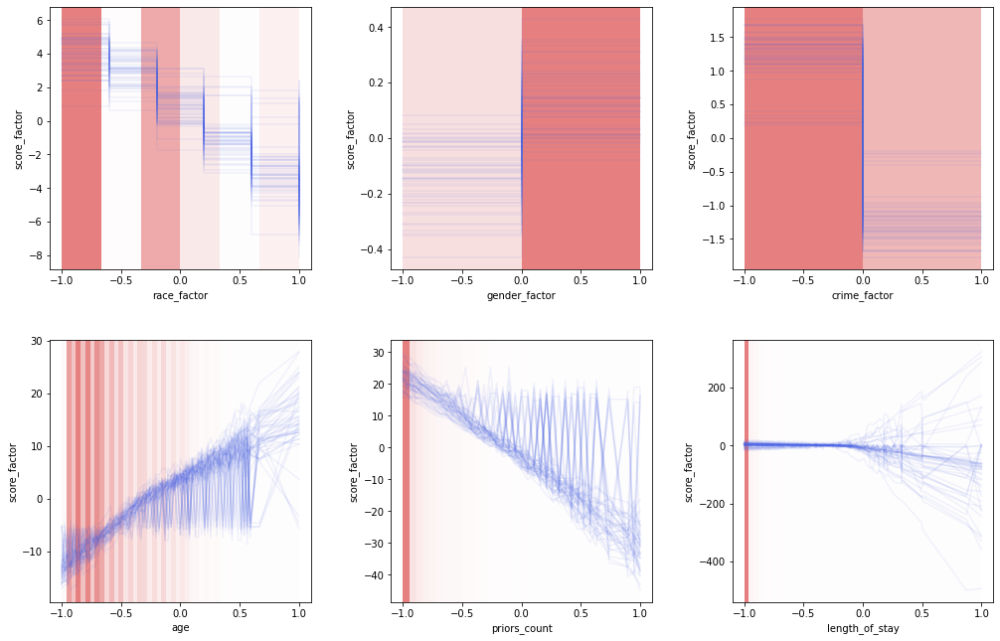

In [101]:
nam_plot(dataset, models)

In [102]:
graphing_dataset = NAMDataset.from_df(config,
                             compas_df, 
                             features_columns=cat_features+numeric_features,
                             targets_column='score_factor')

In [103]:
graphing_dataset.features = torch.tensor(np.array(graphing_dataset.data[cat_features+numeric_features]).astype('float32'))

In [104]:
graphing_dataset.features_names

['race_factor',
 'gender_factor',
 'crime_factor',
 'age',
 'priors_count',
 'length_of_stay']

In [105]:
race_mapping

{'African-American': 0,
 'Asian': 1,
 'Caucasian': 2,
 'Hispanic': 3,
 'Native American': 4,
 'Other': 5}

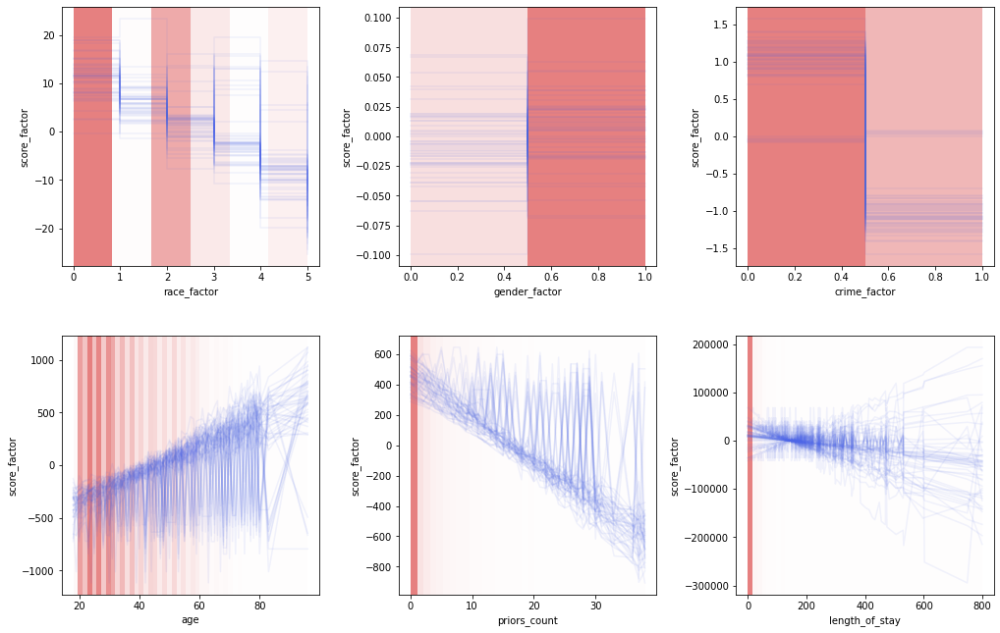

In [106]:
nam_plot(graphing_dataset, models)